### Fraud Transaction Detection

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("double.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


### Exploratory Data Analysis

In [3]:
print(df.shape)
print(df.size)
print(df.info())

(284807, 31)
8829017
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  fl

In [4]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [5]:
#Finding the Null values
df.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [6]:
df.groupby("Class").mean()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,
0,94838.202258,0.008258,-0.006271,0.012171,-0.007860,0.005453,0.002419,0.009637,-0.000987,0.004467,...,-0.000644,-0.001235,-0.000024,0.000070,0.000182,-0.000072,-0.000089,-0.000295,-0.000131,88.291022
1,80746.806911,-4.771948,3.623778,-7.033281,4.542029,-3.151225,-1.397737,-5.568731,0.570636,-2.581123,...,0.372319,0.713588,0.014049,-0.040308,-0.105130,0.041449,0.051648,0.170575,0.075667,122.211321


In [7]:
df["Class"].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [8]:
#Overfitting the values
#0 -Normal
#1 -Fraud
legit=df[df.Class==0]
fraud=df[df.Class==1]

In [9]:
print(legit.shape)
print(fraud.shape)

(284315, 31)
(492, 31)


In [10]:
legit.Amount.describe()

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

In [11]:
legit_sample=legit.sample(492)

In [12]:
#Concatinating the dataset
new_dataset=pd.concat([legit_sample,fraud],axis=0)

In [13]:
#Concatinating the dataset
new_dataset=pd.concat([legit_sample,fraud],axis=0)

In [14]:
new_dataset.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
231898,146969.0,-2.224419,1.131736,-2.393146,-4.895064,2.066201,2.377391,-0.435880,1.907210,0.895883,...,-0.034274,-0.606241,-0.166653,0.671517,0.356800,-1.298962,-0.485791,-0.088422,6.14,0
81454,58934.0,1.141677,-0.099791,0.617345,0.810099,-0.528461,-0.183949,-0.206514,0.071708,0.615920,...,-0.266291,-0.637858,0.097001,0.087951,0.236898,0.209978,-0.006428,0.015865,26.04,0
209993,137796.0,-0.874493,0.729220,-0.355813,-2.059268,2.948486,3.826771,-0.080456,-0.851832,-0.259158,...,1.055198,-1.858608,0.280421,0.632930,-0.650142,0.021747,0.041824,-0.097041,24.68,0
162477,115150.0,2.131117,-1.899929,0.088634,-1.532785,-2.014957,0.188652,-2.038611,0.145034,-0.434653,...,0.083471,0.639733,0.233825,0.570980,-0.506643,-0.121023,0.065417,-0.010564,72.00,0
263891,161162.0,1.953822,-0.286948,-0.884080,1.243154,0.135024,0.453386,-0.384392,0.069366,1.097829,...,0.176342,0.741587,-0.041421,0.045267,0.267883,-0.420434,0.044053,-0.035234,34.90,0


In [15]:
new_dataset.shape

(984, 31)

### Data visualization

<Axes: >

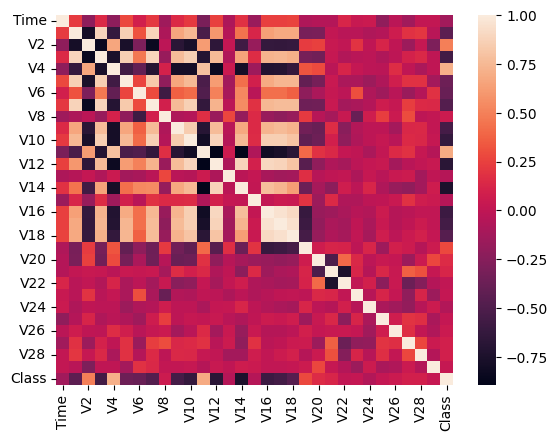

In [16]:
sns.heatmap(new_dataset.corr(),cbar=True)

C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


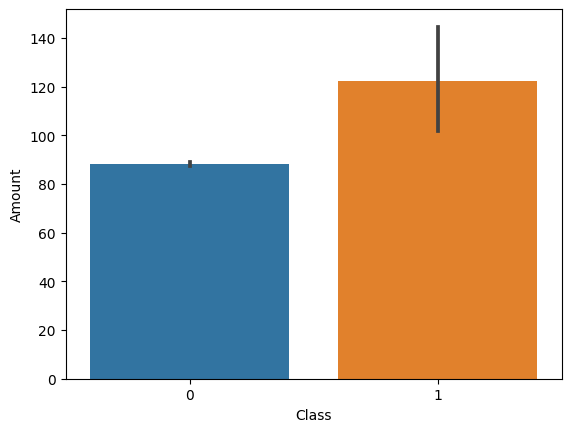

In [32]:
sns.barplot(x="Class",y="Amount",data=df)
plt.show()

In [33]:
sns.pairplot(new_dataset)

C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Srinath\PycharmProjects\pythonProject\venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and w

In [17]:
new_dataset["Class"].value_counts()

Class
0    492
1    492
Name: count, dtype: int64

### Train Test Split

In [18]:
#Training the Dataset
x=new_dataset.drop("Class",axis=1)
y=new_dataset["Class"]

In [19]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=2,stratify=y)

### Logistic Regression

In [20]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()

In [21]:
model.fit(x_train,y_train)

LogisticRegression()

In [22]:
pred1=model.predict(x_train)

In [24]:
from sklearn.metrics import accuracy_score
accuracy_score(y_train,pred1)*100

93.7738246505718

In [26]:
pred2=model.predict(x_test)
accuracy_score(y_test,pred2)*100

93.90862944162437